## Dependencies

In [28]:
import sys
import os
sys.path.append('C:\\Users\oscar\OneDrive\Dokumenter\Høst 2023\TET4565 Spesialiseringsemne\Hydro_optimization') #OSCAR path
sys.path.append('C:\\Users\\benny\\Documents\\Preliminary-project')  #BENJAMIN path
sys.path.append('C:\\Users\\Epsilon Delta\\OneDrive - NTNU\\Energi og Miljø NTNU\\Høst2023\\TET4565 Fordypningsemne\\Hydro_optimization') #ESPEN path

import pyomo.environ as pyo
import numpy as np
from pyomo.environ import ConcreteModel,Set,RangeSet,Param,Suffix,Reals,NonNegativeReals,NonPositiveReals,Binary,Objective,minimize,maximize,value
from pyomo.core import Constraint,Var,Block,ConstraintList
from pyomo.opt import SolverFactory, SolverStatus, TerminationCondition
from pyomo.util.infeasible import log_infeasible_constraints
from pyomo.environ import ConstraintList
from pyomo.dae import *
from calculations.datahandling import*
from calculations.data_processor import* 
import itertools
import matplotlib.pyplot as plt

## Reading in parameters and topology data

In [29]:
# ---------------------------- Read in parameters and hydro topology -------------------------------------- # WE WAIT WITH THIS UNTIL LATER

def InputParameter(data_file):
    inputdata = pd.read_excel(data_file)
    inputdata = inputdata.set_index('Parameter', drop=True)
    inputdata = inputdata.transpose()
    data = {}
    data['prod'] = inputdata[['Ci', 'yi', 'P_min', 'P_max']]
    data['prod'].drop('Solar', inplace=True)
    return data

parameters=InputParameter('data/Parameters.xlsx')


def InputTopology(data_file):
    inputdata = pd.read_excel(data_file,sheet_name='Hydro')
    inputdata = inputdata.set_index('Ormsetfoss', drop=True)
    inputdata = inputdata.transpose()
    data = {}
    data['ormset'] = inputdata[['Pmin', 'Pmax','Vmax','Vmin','Vstart','Qmin','Qmax','Pump_min','Pump_max', 'Q','LRL','HRL','RL_start', 'Spill_min', 'Spill_max']].dropna()
    return data 
topology = InputTopology('data/Ormset_Data.xlsx')

    #Volume-head relationship:
def InputHead(data_file):
    inputdata = pd.read_excel(data_file, sheet_name='Vol_head')
    volume_column='Mm3'
    head_column='m'
    data_volhead = dict(zip(inputdata[volume_column], inputdata[head_column]))
    return data_volhead
headvol_Ormset=InputHead('data/Ormset_Data.xlsx')

def InputHead2(data_file):
    inputdata = pd.read_excel(data_file, sheet_name='Vol_head2')
    volume_column='Mm3'
    head_column='m'
    data_volhead = dict(zip(inputdata[volume_column].dropna(), inputdata[head_column].dropna()))
    return data_volhead
headvol_Buaset=InputHead2('data/Ormset_Data.xlsx')

    #Flow-head relationship:
def InputFlow(data_file): 
    inputdata = pd.read_excel(data_file, sheet_name='flow')
    data_flowhead = {}
    data_flowhead['ormset_headflow'] = inputdata[['Moh','m3/s']].dropna()
    return data_flowhead
headflow=InputFlow('data/Ormset_Data.xlsx')

display(topology)
display(headvol_Ormset)
display(headflow)

def interpolate_head(volume, head_dict):
    volumes = list(head_dict.keys())
    heads = list(head_dict.values())
    return np.interp(volume, volumes, heads)

test=interpolate_head(45, headvol_Ormset)
print(test)


{'ormset': Ormsetfoss  Pmin  Pmax  Vmax  Vmin  Vstart  Qmin  Qmax  Pump_min  Pump_max  \
 Hydro1       0.0  43.0  45.0   0.0    45.0   0.0  12.0       0.0       0.0   
 Hydro2       0.0  30.0  20.0   0.0    20.0   0.0  12.0       0.0       1.6   
 
 Ormsetfoss    Q    LRL    HRL  RL_start  Spill_min  Spill_max  
 Hydro1      4.0  375.0  389.0     389.0        0.0       50.0  
 Hydro2      2.0  326.0  331.5     331.5        0.0       12.0  }

{0.0: 375.0,
 2.08333: 375.99242,
 4.16667: 376.83333,
 6.25: 377.63462,
 8.33333: 378.40476,
 10.41667: 379.09314,
 12.5: 379.70588,
 14.58333: 380.30093,
 16.66667: 380.87963,
 18.75: 381.45833,
 20.83333: 382.03509,
 22.91667: 382.58333,
 25.0: 383.13158,
 27.08333: 383.67982,
 29.16667: 384.22807,
 31.25: 384.77632,
 33.33333: 385.32456,
 35.41667: 385.85417,
 37.5: 386.35714,
 39.58333: 386.85317,
 41.66667: 387.33333,
 43.75: 387.79348,
 45.83333: 388.24638,
 47.91667: 388.65278,
 50.0: 389.0}

{'ormset_headflow':      Moh  m3/s
 0  388.0   0.0
 1  388.2   4.9
 2  388.5  20.4
 3  389.0  68.4}

388.0652204347847


In [30]:
start = '2019-09-01 00:00:00'
end = '2020-08-31 23:00:00'
start_dt = pd.to_datetime(start)
end_dt = pd.to_datetime(end)

    #Input data and read-in
input_data_market = read_csv_data('data/Market_price.csv')              #MARKET
market_prices_h=convert_to_dict(input_data_market, start, end, 'H') ##avg_market_price=average_value(market_prices_h)
avg_market_price=average_value(market_prices_h)

input_data_inflow = read_csv_data('data/Data_inflow.csv')
columns = ['Ormsetvatn','Buavatn']
inflow = convert_to_dict(input_data_inflow, start, end, 'H', columns)
inflow_hydro1 = inflow[0]  # First dictionary for Hydro1 - ORMSETVATN
inflow_hydro2 = inflow[1]  # Second dictionary for Hydro2 - BUAVATN

#Solar production based on forecast (should come from irradiance data)
input_data_PV = read_excel_data('data/PV_spec.xlsx')
input_data_Irr = read_irr_data('data/Data_solar_irr_NOR.csv')
PV_power = pv_power_estimated(input_data_PV,input_data_Irr)
Solar_1=convert_to_dict(PV_power, start, end, 'H')
Solar_p=scale_dict(Solar_1, 10)


input_data_load= read_csv_data('data/Normal_consumption.csv')
load_unscaled=convert_to_dict(input_data_load, start, end, 'H')
load_h=scale_dict(load_unscaled, 0.008)

hours_difference = ((end_dt - start_dt).total_seconds() / 3600)+1  # 3600 seconds in an hour


c:\Users\oscar\OneDrive\Dokumenter\Høst 2023\TET4510 Spesialiseringsprosjekt\Preliminary-project\calculations\datahandling.py:17: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  irr_data = pd.read_csv(file_path, parse_dates=['time'], index_col='time', dtype=float)


## Functions


In [31]:


# Define your input data and constants
#L = {1: 30, 2: 20, 3: 20, 4: 30, 5: 50, 6: 80, 7: 50, 8: 90, 9: 110, 10: 150, 11: 120, 12: 80, 13: 70, 14: 80, 15: 90, 16: 160, 17: 170, 18: 150, 19: 120, 20: 100, 21: 70, 22: 60, 23: 50, 24: 40}

constants = {'eff': 0.91, 'rho': 1000, 'g': 9.81, 'Ri': 30, 'Si': 300, 
             'inflow_scenarios' : ['High', 'Avg', 'Low'], 
             'inflow_probabilities' : {'High': 1/3, 'Avg': 1/3, 'Low': 1/3} }




# Variables for power produced or bought and volume, water level etc.
def p_bounds(model, i, j):
    return (model.Pmin[i], model.Pmax[i])

def q_bounds(model, i, j): #flow rate
    return (model.Qmin[i], model.Qmax[i])

def pump_bounds(model, i, j):
    return(model.Pump_min[i], model.Pump_max[i])

def vol_bounds(model, i, j):
    return (model.Vmin[i], model.Vmax[i])

def init_v(model, i, j):
    return model.v0[i]

def head_bounds(model,i,j):
    return (model.LRL[i], model.HRL[i])

def spill_bounds(model, i, j):
    return (model.S_min[i], model.S_max[i])

#initializing scenarios for inflow


# Constraints
def load_rule(model, j):
    return model.p['Hydro1',j] + model.p['Hydro2',j] + model.solar[j] + model.m['Buy',j] == model.L[j] - (model.r[j]) + model.m['Sell',j]

def power_rule(model,i, j):   #Rule for hydro power production dependent on varying discharge #update to also vary on head
    return  10**-6*model.eff * model.rho * model.g * model.HRL[i] * model.q[i, j] == model.p[i, j]#MW

def vol_rule(model, i):
    tolerance = 1e1  # Adjust the tolerance value as needed (so that volume does not HAVE to be full if we simulate over a small time period)
    return model.v[i, min( model.periods)] >= model.v0[i] - tolerance



# Hydro parameters
fm3 = 3600/1000000 # Conversion factor between m^3/s and Mm^3/hour. 1h = 3600s and M = 10^6.
# Constraint to update volume based on cumulative sum of discharges (VOLUME [MM3] - DISCHARGE [MM3/h] + INFLOW [MM3/h])
# Constraint to update volume based on cumulative sum of discharges (VOLUME [MM3] - DISCHARGE [MM3/h] + INFLOW [MM3/h])


#def v_init_rule(model, i, v):
   #return model.v_init[i,v]==model.v0[i]*v/100


    
def volume_change_rule(model, i, j):  
    if j == min(model.periods): 
        if i == 'Hydro1':
            return model.v[i, j] == (model.v_init1) - (model.q[i, j] *fm3) + (model.inflow1[j]*fm3) + (model.pump['Hydro2',j]*fm3) -(model.s[i,j]*fm3)
        elif i == 'Hydro2':
        # Include the discharge from Hydro1 as inflow to Hydro2 
            return model.v[i, j] == (model.v_init2) - (model.q[i, j] *fm3) + (model.inflow2[j]*fm3) -(model.s[i,j]*fm3)
    elif j>1:
        if i =='Hydro1': 
            return model.v[i, j ] == model.v[i,j-1] - (model.q[i, j] *fm3) + (model.inflow1[j]*fm3) +(model.pump['Hydro2',j]*fm3) -(model.s[i,j]*fm3)
        elif i =='Hydro2':
            return model.v[i, j] == model.v[i,j-1] - (model.q[i, j] *fm3) + (model.inflow2[j]*fm3) -(model.s[i,j]*fm3)   
    else:
        if i == 'Hydro1':
            return model.v[i, j] == (model.v0[i]) - (model.q[i, j] *fm3) + (model.inflow1[j]*fm3) + (model.pump['Hydro2',j]*fm3) -(model.s[i,j]*fm3)
        elif i == 'Hydro2':
        # Include the discharge from Hydro1 as inflow to Hydro2 
            return model.v[i, j] == (model.v0[i]) - (model.q[i, j] *fm3) + (model.inflow2[j]*fm3) -(model.s[i,j]*fm3)
        
    
         
    
def OBJ_one_stage(model):
    return sum((model.Ri*model.r[j] + model.Mi[j] * model.m['Buy', j]) for j in model.periods) + model.alpha


def OBJ_last_stage(model):
    return sum((model.Ri*model.r[j] + model.Mi[j] * model.m['Buy', j]) for j in model.periods )




## Solve last stage setup


In [32]:
def solve_last_stage(constants, topology, stage, states, inflow_scenario1, inflow_scenario2, solar_scenario):
    # Create a ConcreteModel
    model = pyo.ConcreteModel(name="SDP")

    # Define the inflow scenarios and associated probabilities


    # Sets to model hydro topology
    model.periods = pyo.Set(initialize= range ((stage-1)*7*24, (stage)*7*24 + 1, 1))
                      #these sets must be defined in the latex report as well
    model.plants = pyo.Set(initialize=['Hydro1', 'Hydro2'])               #uses i
    model.market = pyo.Set(initialize=['Buy','Sell'])


    # Hydro parameters
    model.eff = pyo.Param(initialize=constants['eff'])
    model.rho = pyo.Param(initialize=constants['rho'])
    model.g = pyo.Param(initialize=constants['g'])

    
    # Cost parameters
    model.Mi = pyo.Param(model.periods, initialize={j: market_prices_h[j] for j in model.periods})            #Market price varying
    model.Ri=pyo.Param(initialize=constants['Ri'])  #Rationing cost for plants
    model.Si=pyo.Param(model.plants, initialize=constants['Si'])  #Spillage  costs for plants 

    #Plant parameters
    model.Pmin=pyo.Param(model.plants, initialize=topology['ormset']['Pmin'])
    model.Pmax=pyo.Param(model.plants, initialize=topology['ormset']['Pmax'])

    #Load parameters
    model.L = pyo.Param(model.periods, initialize={j: load_h[j] for j in model.periods})

    #Topology parameters
    model.Qmin=pyo.Param(model.plants, initialize=topology['ormset']['Qmin']) 
    model.Qmax=pyo.Param(model.plants, initialize=topology['ormset']['Qmax'])
    model.Pump_min=pyo.Param(model.plants, initialize=topology['ormset']['Pump_min'])
    model.Pump_max=pyo.Param(model.plants, initialize=topology['ormset']['Pump_max'])
    model.Vmin=pyo.Param(model.plants, initialize=topology['ormset']['Vmin'])
    model.Vmax=pyo.Param(model.plants, initialize=topology['ormset']['Vmax'])
    model.v0 = pyo.Param(model.plants, initialize=topology['ormset']['Vstart'])
    model.LRL =pyo.Param(model.plants, initialize=topology['ormset']['LRL'])
    model.HRL =pyo.Param(model.plants, initialize=topology['ormset']['HRL'])
    model.S_min=pyo.Param(model.plants, initialize=topology['ormset']['Spill_min'])
    model.S_max=pyo.Param(model.plants, initialize=topology['ormset']['Spill_max'])
    model.v_init1=pyo.Param(initialize=states[0])
    model.v_init2=pyo.Param(initialize= states[1])
    model.inflow1=pyo.Param(model.periods, initialize={j: inflow_scenario1[j] for j in model.periods})
    model.inflow2=pyo.Param(model.periods, initialize={j: inflow_scenario2[j] for j in model.periods})
    model.solar=pyo.Param(model.periods, initialize={j: solar_scenario[j] for j in model.periods})
    # --- Variables ----
    model.inflow = pyo.Var(model.plants,  model.periods,   within=NonNegativeReals)
    model.p = pyo.Var(model.plants,  model.periods,    bounds=p_bounds)                   #Power production
    model.m = pyo.Var(model.market,  model.periods,  within=NonNegativeReals)       #Power bougth from lack of production
    model.q = pyo.Var(model.plants,  model.periods,   bounds=q_bounds)
    model.q_out=pyo.Var(model.plants,  model.periods,   within=NonNegativeReals)
    model.pump=pyo.Var(model.plants,  model.periods,  bounds=pump_bounds)     #Time dependent pump discharge between lower and upper reservoir (dependent on reservoir balance)
    model.v = pyo.Var(model.plants,  model.periods,  bounds=vol_bounds) #time dependent volume which varies based on discharge over time (convert from m3/s to MM3/day ellerno og subtraher)
    model.r=pyo.Var( model.periods,  within=NonNegativeReals) #amount rationed 
    model.s=pyo.Var(model.plants,  model.periods,  bounds=spill_bounds) #amount spilled for each reservoir (should have bounds)
    
 
    #--- CONSTRAINTS---

    model.load_cons = pyo.Constraint( model.periods,   rule=load_rule)
    model.power_prod = pyo.Constraint(model.plants,  model.periods,  rule=power_rule) 
    model.volume_change_cons = pyo.Constraint(model.plants,  model.periods,  rule=volume_change_rule)
    
    # --- Objective function---
    model.obj=pyo.Objective(rule=OBJ_last_stage, sense=pyo.minimize)
    
        
    return model
    


def solve(model):
    #solver 
    opt = SolverFactory('gurobi', solver_io="python") 
    #opt.options['NonConvex']=2    #defining dual 
    model.dual = pyo.Suffix(direction=pyo.Suffix.IMPORT)
    results = opt.solve(model,tee=True) 
            
    return results, model

def displayresults(model):
    return print(model.dual.display())




In [33]:
stages=reversed(range(1, 52 + 1, 1))
scenarios= ['High', 'Avg', 'Low']
Hydro1_initial=[i for i in range (0, 45+9, 9)]
Hydro2_initial=[i for i in range (0, 20+4, 4)]   
state_combinations =[p for p in itertools.product(Hydro1_initial, Hydro2_initial)]

High1=scale_dict(inflow_hydro1, 1.1)
High2=scale_dict(inflow_hydro2, 1.1)
Avg1=scale_dict(inflow_hydro1, 1)
Avg2=scale_dict(inflow_hydro2, 1)
Low1=scale_dict(inflow_hydro1, 0.9)
Low2=scale_dict(inflow_hydro2, 0.9)
scenarios1=[High1, Avg1, Low1]
scenarios2=[High2, Avg2, Low2]

s_high=scale_dict(Solar_p, 1.1)
s_avg=scale_dict(Solar_p, 1)
s_low=scale_dict(Solar_p, 0.9)
s_scenarios=[s_high, s_avg, s_low]

expected={}
Dual_values1={}
Dual_values2={}
for state in state_combinations: 
        expected_scenario=0
        Dual1=0
        Dual2=0
        for i in range(len(scenarios)):
                m=solve_last_stage(constants, topology, 52, state, scenarios1[i], scenarios2[i], s_scenarios[i])
                solve(m)
                expected_scenario+=m.obj()
                Dual1+=m.dual.get(m.volume_change_cons['Hydro1',max(m.periods)])
                Dual2+=m.dual.get(m.volume_change_cons['Hydro2',max(m.periods)])                
        expected[52, state]=expected_scenario/len(scenarios)
        Dual_values1[52, state]=Dual1/len(scenarios)
        Dual_values2[52, state]=Dual2/len(scenarios)
        


Set parameter QCPDual to value 1
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CPU model: Intel(R) Core(TM) i7-8550U CPU @ 1.80GHz, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 845 rows, 2873 columns and 3040 nonzeros
Model fingerprint: 0x5795152d
Coefficient statistics:
  Matrix range     [4e-03, 3e+00]
  Objective range  [1e+00, 3e+01]
  Bounds range     [2e+00, 5e+01]
  RHS range        [2e-04, 5e+05]
Presolve removed 484 rows and 2064 columns
Presolve time: 0.01s
Presolved: 361 rows, 809 columns, 1213 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    1.8705378e+03   3.744469e+02   0.000000e+00      0s
     402    4.0658836e+04   0.000000e+00   0.000000e+00      0s

Solved in 402 iterations and 0.02 seconds (0.00 work units)
Optimal objective  4.065883619e+04
Set parameter QCPDual to value 1
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CP

In [34]:
print(expected)
print(Dual_values1)
print(Dual_values2)


{(52, (0, 0)): 42110.02184907273, (52, (0, 4)): 4004.4426494545382, (52, (0, 8)): 4004.4426494545382, (52, (0, 12)): 4004.4426494545382, (52, (0, 16)): 4004.4426494545382, (52, (0, 20)): 4004.4426494545382, (52, (9, 0)): 38245.32780003543, (52, (9, 4)): 1870.537793218594, (52, (9, 8)): 1870.537793218594, (52, (9, 12)): 1870.537793218594, (52, (9, 16)): 1870.537793218594, (52, (9, 20)): 1870.537793218594, (52, (18, 0)): 38245.32780003543, (52, (18, 4)): 1870.537793218594, (52, (18, 8)): 1870.537793218594, (52, (18, 12)): 1870.537793218594, (52, (18, 16)): 1870.537793218594, (52, (18, 20)): 1870.537793218594, (52, (27, 0)): 38245.32780003543, (52, (27, 4)): 1870.537793218594, (52, (27, 8)): 1870.537793218594, (52, (27, 12)): 1870.537793218594, (52, (27, 16)): 1870.537793218594, (52, (27, 20)): 1870.537793218594, (52, (36, 0)): 38245.32780003543, (52, (36, 4)): 1870.537793218594, (52, (36, 8)): 1870.537793218594, (52, (36, 12)): 1870.537793218594, (52, (36, 16)): 1870.537793218594, (52, (

In [35]:
def solve_one_stage(constants, topology, stage, states, inflow_scenario1, inflow_scenario2, solar_scenario, alpha_values, dual_res1, dual_res2):
    # Create a ConcreteModel
    model = pyo.ConcreteModel(name="SDP")

    # Define the inflow scenarios and associated probabilities
    model.scenarios=pyo.Set(initialize=constants['inflow_scenarios'])
    
    
    
    # Sets to model hydro topology
    if stage>1:
        model.periods = pyo.Set(initialize= range ((stage-1)*7*24, (stage)*7*24 + 1, 1))
    else:
        model.periods = pyo.Set(initialize= range ((stage-1)*7*24 + 1, (stage)*7*24 + 1, 1))
                      #these sets must be defined in the latex report as well
    model.plants = pyo.Set(initialize=['Hydro1', 'Hydro2'])               #uses i
    model.market = pyo.Set(initialize=['Buy','Sell'])


    # Hydro parameters
    model.eff = pyo.Param(initialize=constants['eff'])
    model.rho = pyo.Param(initialize=constants['rho'])
    model.g = pyo.Param(initialize=constants['g'])

    
    # Cost parameters
    model.Mi = pyo.Param(model.periods, initialize={j: market_prices_h[j] for j in model.periods})            #Market price varying
    model.Ri=pyo.Param(initialize=constants['Ri'])  #Rationing cost for plants
    model.Si=pyo.Param(model.plants, initialize=constants['Si'])  #Spillage  costs for plants 

    #Plant parameters
    model.Pmin=pyo.Param(model.plants, initialize=topology['ormset']['Pmin'])
    model.Pmax=pyo.Param(model.plants, initialize=topology['ormset']['Pmax'])

    #Load parameters
    model.L = pyo.Param(model.periods, initialize={j: load_h[j] for j in model.periods})

    #Topology parameters
    model.Qmin=pyo.Param(model.plants, initialize=topology['ormset']['Qmin']) 
    model.Qmax=pyo.Param(model.plants, initialize=topology['ormset']['Qmax'])
    model.Pump_min=pyo.Param(model.plants, initialize=topology['ormset']['Pump_min'])
    model.Pump_max=pyo.Param(model.plants, initialize=topology['ormset']['Pump_max'])
    model.Vmin=pyo.Param(model.plants, initialize=topology['ormset']['Vmin'])
    model.Vmax=pyo.Param(model.plants, initialize=topology['ormset']['Vmax'])
    model.v0 = pyo.Param(model.plants, initialize=topology['ormset']['Vstart'])
    model.LRL =pyo.Param(model.plants, initialize=topology['ormset']['LRL'])
    model.HRL =pyo.Param(model.plants, initialize=topology['ormset']['HRL'])
    model.S_min=pyo.Param(model.plants, initialize=topology['ormset']['Spill_min'])
    model.S_max=pyo.Param(model.plants, initialize=topology['ormset']['Spill_max'])
    model.v_init1=pyo.Param(initialize=states[0])
    model.v_init2=pyo.Param(initialize= states[1])
    model.inflow1=pyo.Param(model.periods, initialize={j: inflow_scenario1[j] for j in model.periods})
    model.inflow2=pyo.Param(model.periods, initialize={j: inflow_scenario2[j] for j in model.periods})
    model.solar=pyo.Param(model.periods, initialize={j: solar_scenario[j] for j in model.periods})
    #Scenario parameter
    
    # --- Variables ----
    model.p = pyo.Var(model.plants,  model.periods,    bounds=p_bounds)                   #Power production
    model.m = pyo.Var(model.market,  model.periods,  within=NonNegativeReals)       #Power bougth from lack of production
    model.q = pyo.Var(model.plants,  model.periods,   bounds=q_bounds)
    model.q_out=pyo.Var(model.plants,  model.periods,   within=NonNegativeReals)
    model.pump=pyo.Var(model.plants,  model.periods,  bounds=pump_bounds)     #Time dependent pump discharge between lower and upper reservoir (dependent on reservoir balance)
    model.v = pyo.Var(model.plants,  model.periods,  bounds=vol_bounds) #time dependent volume which varies based on discharge over time (convert from m3/s to MM3/day ellerno og subtraher)
    model.r=pyo.Var( model.periods,  within=NonNegativeReals) #amount rationed 
    model.s=pyo.Var(model.plants,  model.periods,  bounds=spill_bounds) #amount spilled for each reservoir (should have bounds)
    
    #Creating future cost variable
    model.alpha=pyo.Var()
 
    #--- CONSTRAINTS---
    model.load_cons = pyo.Constraint( model.periods,   rule=load_rule)
    model.power_prod = pyo.Constraint(model.plants,  model.periods,  rule=power_rule) 
    model.volume_change_cons = pyo.Constraint(model.plants,  model.periods,  rule=volume_change_rule)
    
    # Creating a constraint list for the FCF
    model.alpha_cons=pyo.ConstraintList()
    
    # List to store expected cost from previous stage
    phi_values = []
    
    #List to store dual value of reservoir 1 & 2 in previous stage
    lambda1_values = []
    lambda2_values = []

    #List to store initial volumes introduced in states
    state_volumes=[]
    
    #Appending values for previous stage 
    for key in alpha_values:
        if key[0]==stage+1:
            state_volumes.append(key[1])
            phi_values.append(alpha_values[key])
            lambda1_values.append(dual_res1[key])
            lambda2_values.append(dual_res2[key])
        else:
            pass
    
    # Calculate the FCF for each discrete point and constrain alpha through cuts: a>= phi - lambda1*(x1-x1_hat) - lambda2*(x2-x2_hat) for each state, where x1 is the average end-of-stage volume for all scenarios
    for i in range(len(state_volumes)):
        model.alpha_cons.add(model.alpha >= phi_values[i] + lambda1_values[i]*(model.v['Hydro1', max(model.periods)]-  (state_volumes[i][0])) + lambda2_values[i]*(model.v['Hydro2', max(model.periods)]  - (state_volumes[i][1])))
        
    # --- Objective function---
    
    
    model.obj=pyo.Objective(rule=OBJ_one_stage, sense=pyo.minimize)
    
        
    return model
    

In [36]:
stages=reversed(range(1, 51 + 1, 1))
scenarios= ['High', 'Avg', 'Low']
Hydro1_initial=[i for i in range (0, 45+9, 9)]
Hydro2_initial=[i for i in range (0, 20+4, 4)]   
state_combinations =[p for p in itertools.product(Hydro1_initial, Hydro2_initial)]

#Inflow scenarios
High1=scale_dict(inflow_hydro1, 1.1)
High2=scale_dict(inflow_hydro2, 1.1)
Avg1=scale_dict(inflow_hydro1, 1)
Avg2=scale_dict(inflow_hydro2, 1)
Low1=scale_dict(inflow_hydro1, 0.9)
Low2=scale_dict(inflow_hydro2, 0.9)
scenarios1=[High1, Avg1, Low1]
scenarios2=[High2, Avg2, Low2]

#Irradiation scenarios
s_high=scale_dict(Solar_p, 1.1)
s_avg=scale_dict(Solar_p, 1)
s_low=scale_dict(Solar_p, 0.9)
s_scenarios=[s_high, s_avg, s_low]

alpha_dict={}
alpha_dict2={}
WV1_dict={}
WV2_dict={}
for stage in stages:
    for state in state_combinations: 
            expected_scenario=0
            Dual1=0
            Dual2=0
            alpha=0
            vol1=0
            vol2=0
            for i in range(len(scenarios)):
                    m2=solve_one_stage(constants, topology, stage, state, scenarios1[i], scenarios2[i], s_scenarios[i], expected, Dual_values1, Dual_values2)
                    solve(m2)
                    expected_scenario+=m2.obj()
                    Dual1+=m2.dual.get(m2.volume_change_cons['Hydro1',max(m2.periods)])
                    Dual2+=m2.dual.get(m2.volume_change_cons['Hydro2',max(m2.periods)]) 
                    alpha+=m2.alpha.value
                    vol1+=m2.v['Hydro1', max(m2.periods)].value
                    vol2+=m2.v['Hydro2', max(m2.periods)].value    
            expected[stage, state]=expected_scenario/len(scenarios)
            Dual_values1[stage, state]=Dual1/len(scenarios)
            Dual_values2[stage, state]=Dual2/len(scenarios)
            alpha_dict[stage,state]=alpha/len(scenarios)
            alpha_dict2[stage, (vol1/len(scenarios), vol2/len(scenarios))]= alpha/len(scenarios)

Set parameter QCPDual to value 1
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CPU model: Intel(R) Core(TM) i7-8550U CPU @ 1.80GHz, instruction set [SSE2|AVX|AVX2]
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads

Optimize a model with 881 rows, 2536 columns and 3082 nonzeros
Model fingerprint: 0x42f6ac51
Coefficient statistics:
  Matrix range     [4e-03, 2e+04]
  Objective range  [1e+00, 5e+01]
  Bounds range     [2e+00, 5e+01]
  RHS range        [4e-05, 6e+05]
Presolve removed 564 rows and 1830 columns
Presolve time: 0.01s
Presolved: 317 rows, 706 columns, 1064 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    7.9208345e+03   1.179193e+03   0.000000e+00      0s
     428    8.7729631e+04   0.000000e+00   0.000000e+00      0s

Solved in 428 iterations and 0.02 seconds (0.00 work units)
Optimal objective  8.772963118e+04
Set parameter QCPDual to value 1
Gurobi Optimizer version 10.0.2 build v10.0.2rc0 (win64)

CP

{(51, (0, 0)): 42110.02184907273, (51, (0, 4)): 4004.4426494545382, (51, (0, 8)): 4004.4426494545382, (51, (0, 12)): 4004.4426494545382, (51, (0, 16)): 4004.4426494545382, (51, (0, 20)): 4004.4426494545382, (51, (9, 0)): 42110.02184907273, (51, (9, 4)): 4004.4426494545382, (51, (9, 8)): 4004.4426494545382, (51, (9, 12)): 4004.4426494545382, (51, (9, 16)): 4004.4426494545382, (51, (9, 20)): 4004.4426494545382, (51, (18, 0)): 42110.02184907273, (51, (18, 4)): 4004.4426494545382, (51, (18, 8)): 4004.4426494545382, (51, (18, 12)): 4004.4426494545382, (51, (18, 16)): 4004.4426494545382, (51, (18, 20)): 4004.4426494545382, (51, (27, 0)): 42110.02184907273, (51, (27, 4)): 4004.4426494545382, (51, (27, 8)): 4004.4426494545382, (51, (27, 12)): 4004.4426494545382, (51, (27, 16)): 4004.4426494545382, (51, (27, 20)): 4004.4426494545382, (51, (36, 0)): 42110.02184907273, (51, (36, 4)): 4004.4426494545382, (51, (36, 8)): 4004.4426494545382, (51, (36, 12)): 4004.4426494545382, (51, (36, 16)): 4004.44

C:\Users\oscar\AppData\Local\Temp\ipykernel_17508\3326718359.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap("tab20")


<Figure size 2000x1200 with 0 Axes>

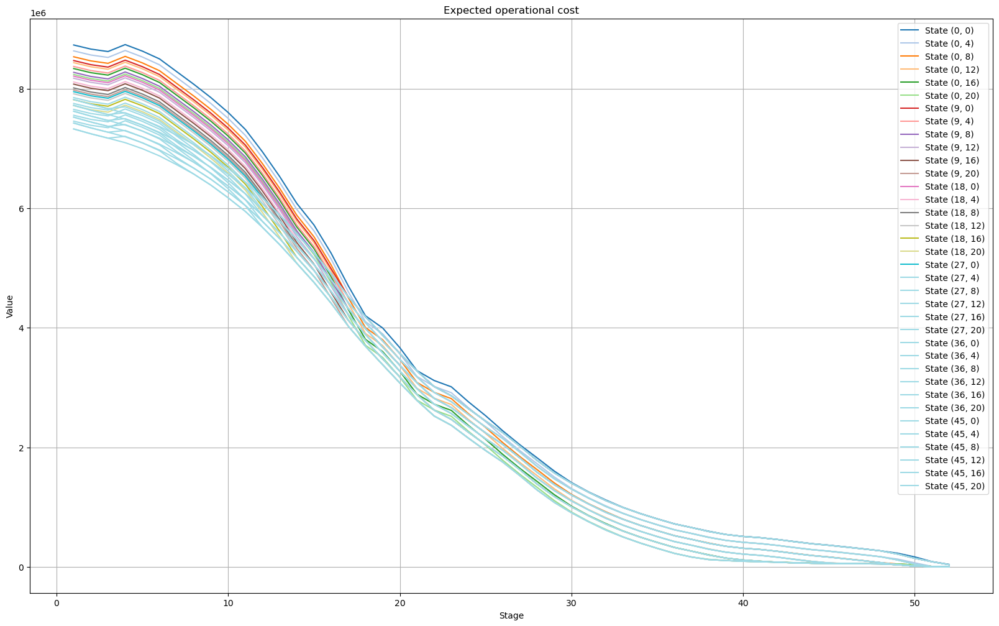

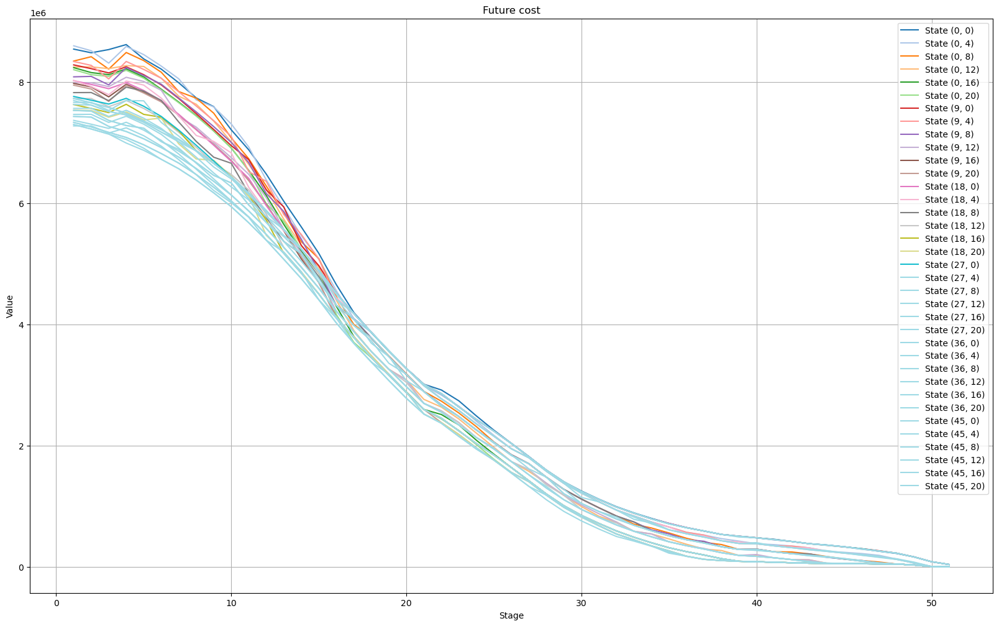

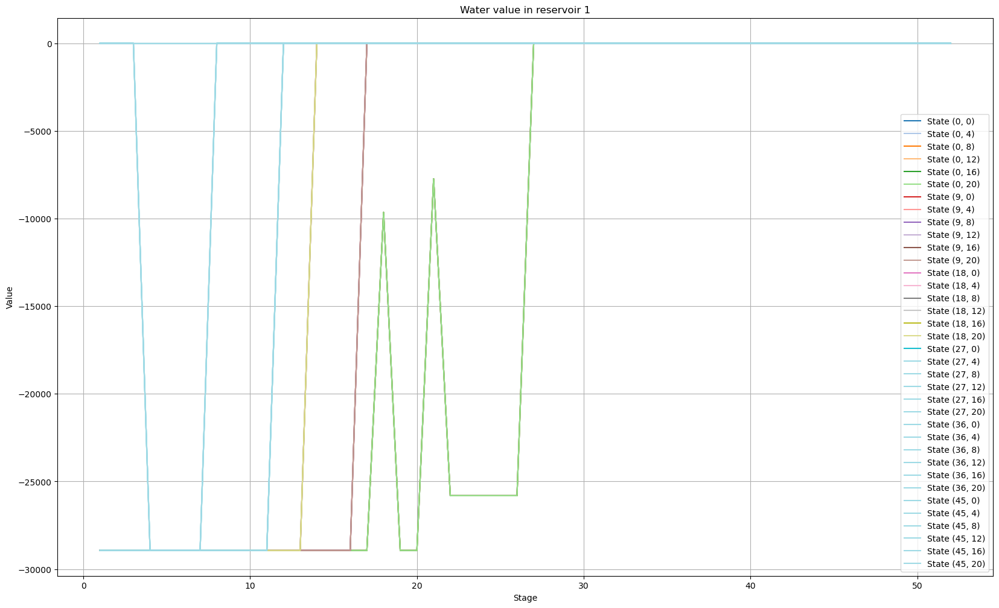

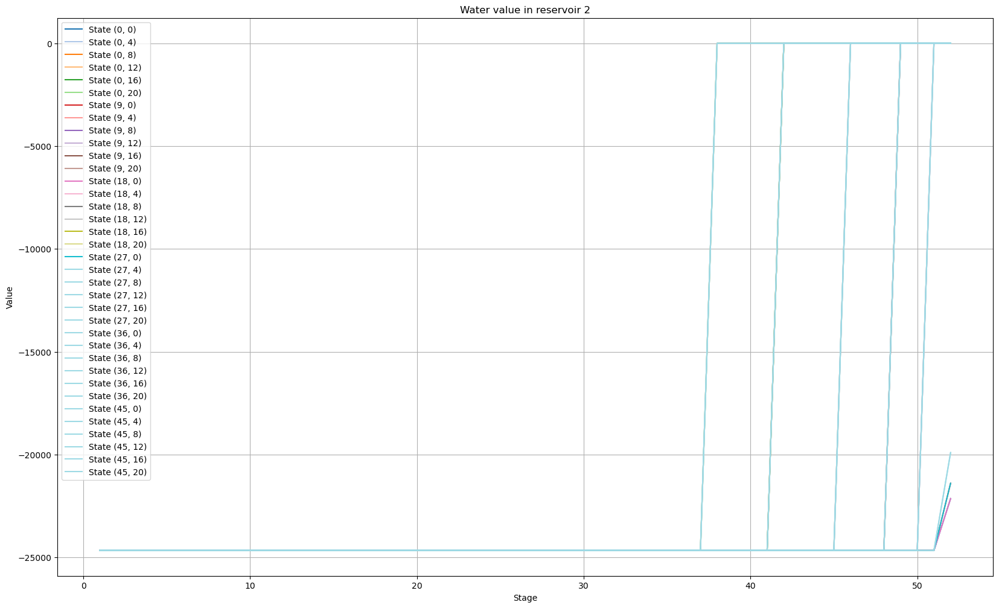

In [37]:
from itertools import cycle
from matplotlib.cm import get_cmap

print(alpha_dict)
# Define your dictionaries and titles
dictionaries = [expected, alpha_dict,Dual_values1, Dual_values2]
titles = ["Expected operational cost", "Future cost", "Water value in reservoir 1",  "Water value in reservoir 2"]

# Set a larger figure size
plt.figure(figsize=(20, 12))

# Define a cycle of colormaps for states
cmap = get_cmap("tab20")

# Iterate through the dictionaries
for dictionary, title in zip(dictionaries, titles):
    states = {}
    
    # Create a separate figure for each dictionary
    plt.figure(figsize=(20, 12))
    
    for key, value in dictionary.items():
        stage, state = key
        if state not in states:
            states[state] = {"stages": [], "values": []}
        states[state]["stages"].append(stage)
        states[state]["values"].append(value)
    
    # Plot each state with a different color
    for i, (state, data) in enumerate(states.items()):
        color = cmap(i)
        plt.plot(data["stages"], data["values"], label=f"State {state}", color=color)
    
    # Add labels, title, and legend for the current dictionary
    plt.xlabel("Stage")
    plt.ylabel("Value")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

In [38]:


# Create a DataFrame from the dictionary
df = pd.DataFrame(alpha_dict.values(), index=pd.MultiIndex.from_tuples(alpha_dict.keys(), names=['Stage', 'State']), columns=['Future Cost'])

# Pivot the DataFrame to have stages as columns and states as rows
pivot_df = df.pivot_table(index='State', columns='Stage', values='Future Cost', fill_value='')

# Specify the filename for the CSV file
csv_file = 'Future_cost_s.csv'

# Save the DataFrame to a CSV file
pivot_df.to_csv(csv_file)


In [39]:
# Create a DataFrame from the dictionary
df = pd.DataFrame(Dual_values1.values(), index=pd.MultiIndex.from_tuples(Dual_values1.keys(), names=['Stage', 'State']), columns=['Future Cost'])

# Pivot the DataFrame to have stages as columns and states as rows
pivot_df = df.pivot_table(index='State', columns='Stage', values='Future Cost', fill_value='')

# Specify the filename for the CSV file
csv_file = 'WV1_s.csv'

# Save the DataFrame to a CSV file
pivot_df.to_csv(csv_file)

In [40]:
# Create a DataFrame from the dictionary
df = pd.DataFrame(Dual_values2.values(), index=pd.MultiIndex.from_tuples(Dual_values2.keys(), names=['Stage', 'State']), columns=['Future Cost'])

# Pivot the DataFrame to have stages as columns and states as rows
pivot_df = df.pivot_table(index='State', columns='Stage', values='Future Cost', fill_value='')

# Specify the filename for the CSV file
csv_file = 'WV2_s.csv'

# Save the DataFrame to a CSV file
pivot_df.to_csv(csv_file)

In [41]:
print(alpha_dict)

{(51, (0, 0)): 42110.02184907273, (51, (0, 4)): 4004.4426494545382, (51, (0, 8)): 4004.4426494545382, (51, (0, 12)): 4004.4426494545382, (51, (0, 16)): 4004.4426494545382, (51, (0, 20)): 4004.4426494545382, (51, (9, 0)): 42110.02184907273, (51, (9, 4)): 4004.4426494545382, (51, (9, 8)): 4004.4426494545382, (51, (9, 12)): 4004.4426494545382, (51, (9, 16)): 4004.4426494545382, (51, (9, 20)): 4004.4426494545382, (51, (18, 0)): 42110.02184907273, (51, (18, 4)): 4004.4426494545382, (51, (18, 8)): 4004.4426494545382, (51, (18, 12)): 4004.4426494545382, (51, (18, 16)): 4004.4426494545382, (51, (18, 20)): 4004.4426494545382, (51, (27, 0)): 42110.02184907273, (51, (27, 4)): 4004.4426494545382, (51, (27, 8)): 4004.4426494545382, (51, (27, 12)): 4004.4426494545382, (51, (27, 16)): 4004.4426494545382, (51, (27, 20)): 4004.4426494545382, (51, (36, 0)): 42110.02184907273, (51, (36, 4)): 4004.4426494545382, (51, (36, 8)): 4004.4426494545382, (51, (36, 12)): 4004.4426494545382, (51, (36, 16)): 4004.44

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


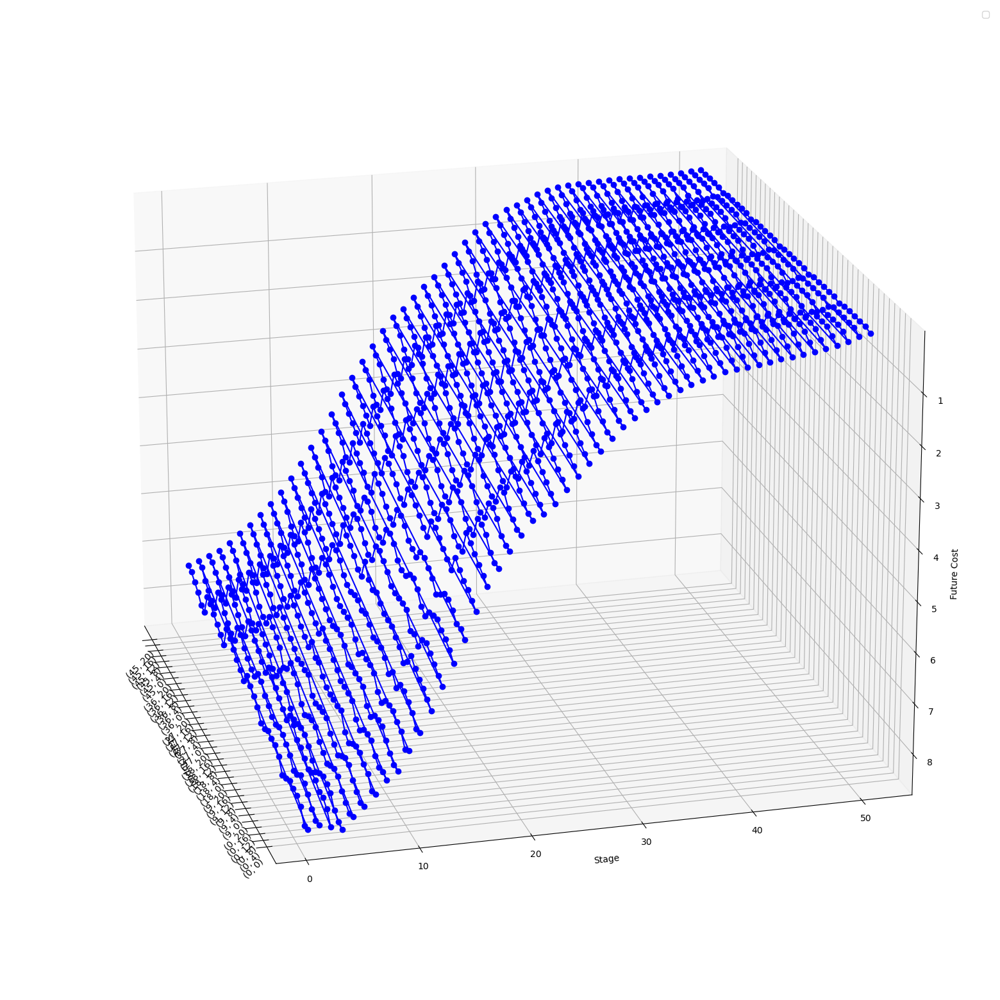

In [42]:
# Extract the stage, state, and future cost values from the alpha_dict
stages = [stage for stage, state in alpha_dict.keys()]
state_tuples = [str(state) for stage, state in alpha_dict.keys()]
future_costs = list(alpha_dict.values())

# Create a 3D plot
fig = plt.figure(figsize=(40,20))
ax = fig.add_subplot(111, projection='3d')

# Map the state tuples to unique numeric values
state_mapping = {state: i for i, state in enumerate(state_tuples)}
state_numeric = [state_mapping[state] for state in state_tuples]

# Plot the data points with stage on the y-axis and state on the x-axis
ax.plot(state_numeric, stages, future_costs, c='b', marker='o')
ax.view_init(-160, 15) 
# Set labels for the axes
ax.set_xticks(list(state_mapping.values()))
ax.set_xticklabels(list(state_mapping.keys()), rotation=45)
ax.set_xlabel('State (Tuple)')
ax.set_ylabel('Stage')
ax.set_zlabel('Future Cost')
plt.legend()

plt.show()

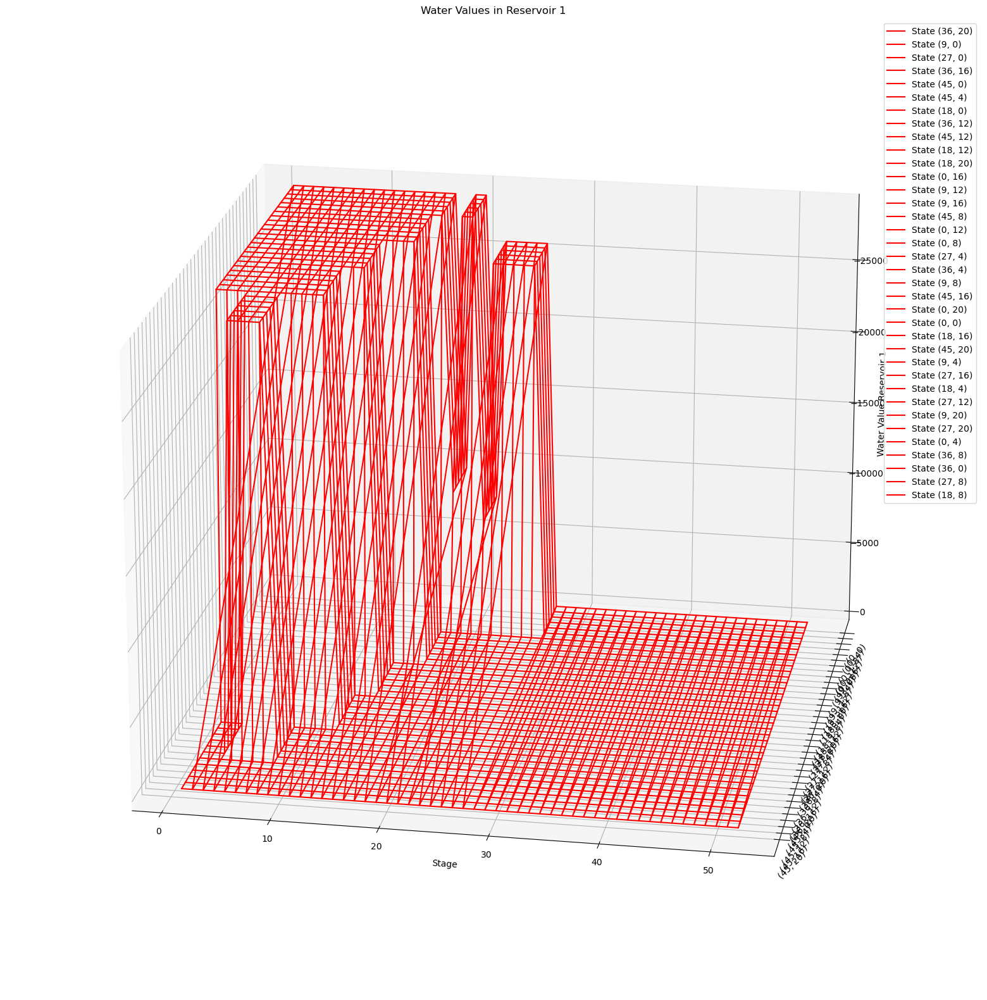

In [43]:
# Extract the stage, state, and future cost values from the alpha_dict
stages = [stage for stage, state in Dual_values1.keys()]
state_tuples = [str(state) for stage, state in Dual_values1.keys()]
future_costs = list(Dual_values1.values())

# Map the state tuples to unique numeric values
state_mapping = {state: i for i, state in enumerate(state_tuples)}
state_numeric = [state_mapping[state] for state in state_tuples]

# Create a 3D plot
fig = plt.figure(figsize=(40, 20))
ax = fig.add_subplot(111, projection='3d')

# Create a list of unique states
unique_states = list(set(state_tuples))

# Plot the data points with state on the x-axis and stage on the y-axis
for state in unique_states:
    # Get the indices of data points that correspond to the current state
    state_indices = [i for i, s in enumerate(state_tuples) if s == state]
    
    # Extract the corresponding stages and future costs for the current state
    state_stages = [stages[i] for i in state_indices]
    state_costs = [future_costs[i] for i in state_indices]
    
    # Plot a line for the current state
    ax.plot(state_stages, [state_mapping[state]] * len(state_stages), state_costs, label=f'State {state}', c='r')
ax.plot(stages, state_numeric, future_costs,  c='r' )
ax.view_init(-160, -100)
# Set labels for the axes
ax.set_yticks(list(state_mapping.values()))
ax.set_yticklabels(list(state_mapping.keys()), rotation=45)
ax.set_xlabel('Stage')
ax.set_zlabel('Water Value Reservoir 1')

plt.title("Water Values in Reservoir 1")
plt.legend()
plt.show()

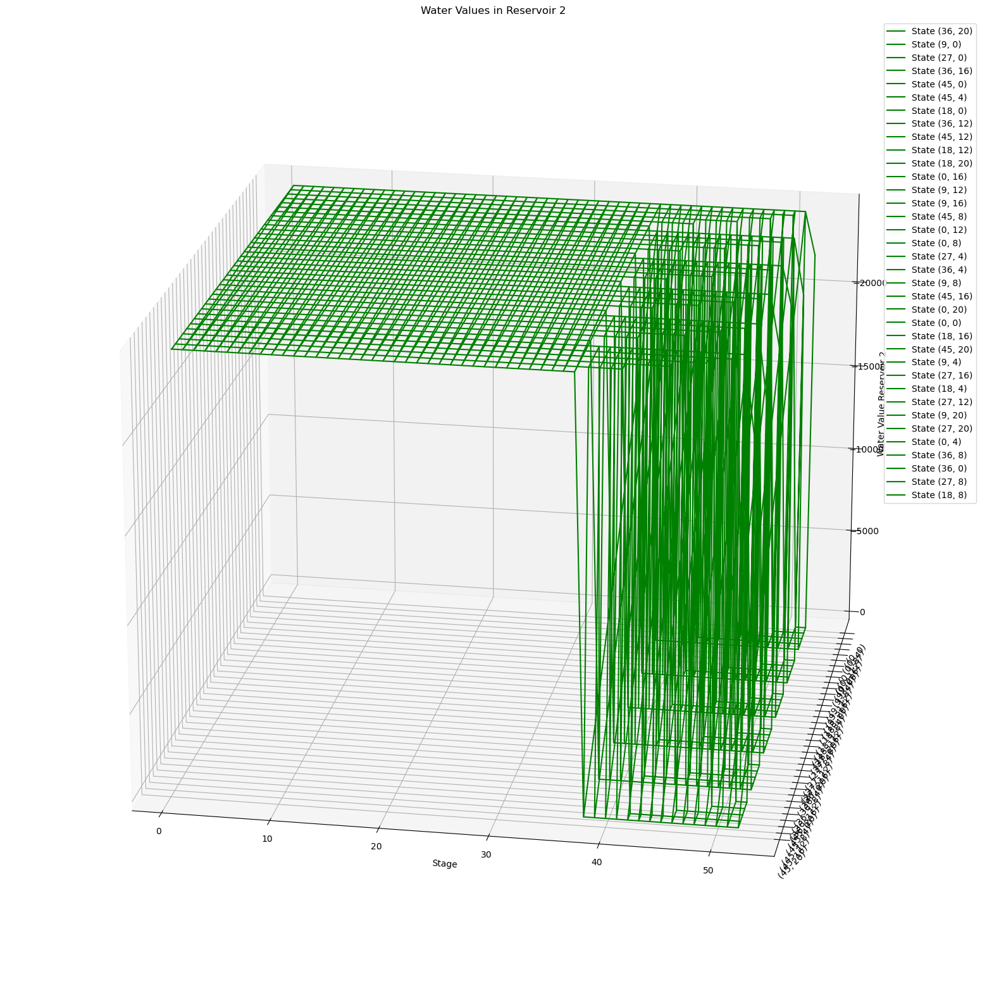

In [44]:
# Extract the stage, state, and future cost values from the alpha_dict
stages = [stage for stage, state in Dual_values2.keys()]
state_tuples = [str(state) for stage, state in Dual_values2.keys()]
future_costs = list(Dual_values2.values())

# Create a 3D plot
# Map the state tuples to unique numeric values
state_mapping = {state: i for i, state in enumerate(state_tuples)}
state_numeric = [state_mapping[state] for state in state_tuples]

# Create a 3D plot
fig = plt.figure(figsize=(40, 20))
ax = fig.add_subplot(111, projection='3d')

# Create a list of unique states
unique_states = list(set(state_tuples))

# Plot the data points with state on the x-axis and stage on the y-axis
for state in unique_states:
    # Get the indices of data points that correspond to the current state
    state_indices = [i for i, s in enumerate(state_tuples) if s == state]
    
    # Extract the corresponding stages and future costs for the current state
    state_stages = [stages[i] for i in state_indices]
    state_costs = [future_costs[i] for i in state_indices]
    
    # Plot a line for the current state
    ax.plot(state_stages, [state_mapping[state]] * len(state_stages), state_costs, label=f'State {state}', c='g')
ax.plot(stages, state_numeric, future_costs,  c='g' )
ax.view_init(-160, -100)
# Set labels for the axes
ax.set_yticks(list(state_mapping.values()))
ax.set_yticklabels(list(state_mapping.keys()), rotation=45)
ax.set_xlabel('Stage')
ax.set_zlabel('Water Value Reservoir 2')

plt.title("Water Values in Reservoir 2")
plt.legend()
plt.show()